<h1> Airbnb project: What impacts the Airbnb’s Spatial Distribution in U.S. cities?</h1>
<p> - team beautifulsoup

<h2> Part 1: Data Preprocessing

In [46]:
import numpy                 as np
import pandas                as pd
import matplotlib.pyplot     as plt
import seaborn               as sns
import sklearn.metrics       as Metrics
from uszipcode import SearchEngine


import folium  #needed for interactive map
from folium.plugins import HeatMap
import plotly.graph_objects as go
import plotly.express as px
import branca.colormap as cm
from plotly.offline import iplot, init_notebook_mode
import cufflinks as cf


from   collections             import Counter
from   collections             import defaultdict
from   sklearn                 import preprocessing
from   sklearn                 import decomposition
from   datetime                import datetime
from   math                    import exp
from   sklearn.linear_model    import LinearRegression as LinReg
from   sklearn.metrics         import mean_absolute_error
from   sklearn.metrics         import median_absolute_error
from   sklearn.metrics         import r2_score
from   sklearn.model_selection import ShuffleSplit
from   sklearn.ensemble        import RandomForestRegressor
from sklearn.manifold import TSNE
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.cluster import DBSCAN
from sklearn import metrics
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist
from sklearn.mixture import GaussianMixture
from scipy.stats import multivariate_normal as mvn

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set(style='white')
cf.go_offline(connected=True)
init_notebook_mode(connected=True)
mapbox_token ='pk.eyJ1IjoibWFnZ2llNjE2IiwiYSI6ImNrMnFvOGZhazAwdXYzY3BydHYxMnV2ZXMifQ.kgmjVzysiQkB8aKVBylDhQ'


1）非uszipcode数据：下载csv （简单解释，无须整理）
airbnb, transportation, venues, crime, rent index

2）uszipcode数据：api获取 （api获取整理进notebook2/放在这里/干脆不放）
c_distance, population, household income, education, employment, real estate

读取上述数据的所有csv，通过group by获得zipcode level的初始大表。

<h3>1-1 data not from uszipcode

In [6]:
#listing data
bos = pd.read_csv('airbnb_data/boston_listings.csv')
ny = pd.read_csv('airbnb_data/NY_listings.csv')
dc = pd.read_csv('airbnb_data/dc_listings.csv')

#transportation
bus = pd.read_csv('transportation_data/bus_with_zipcode.csv',
                  usecols=['stop_lon', 'stop_lat','city','zipcode'])
bus.columns =['longitude', 'latitude','city','zipcode']
sub = pd.read_csv('transportation_data/subway_with_zipcode.csv',
                  usecols=['station_lon','station_lat', 'city', 'zipcode'])
sub.columns = ['longitude', 'latitude','city','zipcode']

#venue
bos_venue = pd.read_csv('venue_data/bos_venue_cleaned.csv')
ny_venue = pd.read_csv('venue_data/ny_venue_cleaned.csv')
dc_venue = pd.read_csv('venue_data/dc_venue_cleaned.csv')

#crime
bos_crime = pd.read_csv('crime_data/bos_crime_zipcode.csv',usecols=['Lat','Long','Zipcode'])
ny_crime = pd.read_csv('crime_data/ny_crime_zipcode.csv',usecols=['Lat','Long' ,'Zipcode'])
dc_crime = pd.read_csv('crime_data/dc_crime_zipcode.csv',usecols=['Lat','Long' ,'Zipcode'])
for table in [bos_crime,ny_crime,dc_crime]:
    table.columns= ['latitude','longitude','zipcode']
#rent
rent = pd.read_csv('zipcode_level_data/zillow_rent_index.csv',encoding='latin-1',usecols=['RegionName','Zri'])
rent.columns =['zipcode','zillow_rent_index']
rent['zipcode'] = rent['zipcode'].apply(lambda x:str(x).zfill(5))

#c-distance
bos_dis =pd.read_csv('zipcode_level_data/bos_data_by_zipcode_with_C-distance.csv',usecols=['zipcode','C-distance_bc', 'C-distance_ch'])
ny_dis =pd.read_csv('zipcode_level_data/ny_data_by_zipcode_with_C-distance.csv',usecols=['zipcode','C-distance_ts', 'C-distance_ch'])
dc_dis =pd.read_csv('zipcode_level_data/dc_data_by_zipcode_with_C-distance.csv',usecols=['zipcode','C-distance_wh', 'C-distance_ch'])
for df in [bos_dis,ny_dis,dc_dis]:
    df['zipcode'] = df['zipcode'].apply(lambda x:str(x).zfill(5))


In [7]:
def clean_listing(list_):
    use_col = ['id','name','city','state','zipcode','price','bedrooms',\
               'latitude','longitude','number_of_reviews',\
               'review_scores_location','review_scores_value']
    try:
        list_['price']= list_['price'].apply(lambda x:float(x.strip('$').replace(',','')))
    except:
        None    
    def fix_zip(input_zip):
        try:
            input_zip = int(input_zip)
        except:
            try:
                input_zip = int(input_zip.split('-')[0])
            except:
                try:
                    input_zip = int(input_zip.split(' ')[1])
                except:
                    return np.NaN
        input_zip = str(input_zip).zfill(5)
        return input_zip
    list_['zipcode']=list_['zipcode'].apply(fix_zip)
    #drop zipcode is nan
    list_ = list_[~list_['zipcode'].isna()]
    list_ = list_[use_col] 
    return list_

In [8]:
def get_poi(venue):
    venue = venue.dropna()
    venue['zipcode'] = venue['zipcode'].apply(int)
    venue= venue.dropna(how='any')
    restaurant = venue.loc[venue['type']=='restaurant']
    market = venue.loc[venue['type']=='market']
    tourist_attractions = venue.loc[venue['type'].isin(['tourist_attraction','park'])]
    travel_agency =  venue.loc[venue['type']=='travel_agency']
    
    return restaurant,market,tourist_attractions,travel_agency

In [9]:
ny_list = clean_listing(ny)
bos_list = clean_listing(bos)
dc_list = clean_listing(dc)
ny_zipcodes = ny_list.zipcode.unique()
bos_zipcodes = bos_list.zipcode.unique()
dc_zipcodes = dc_list.zipcode.unique()

In [10]:
ny_restaurant,ny_market,ny_tourist_attractions,ny_travel_agency = get_poi(ny_venue)
bos_restaurant,bos_market,bos_tourist_attractions,bos_travel_agency = get_poi(bos_venue)
dc_restaurant,dc_market,dc_tourist_attractions,dc_travel_agency = get_poi(dc_venue)

<h3>1-2 data from package uszipcode

把代码附在uszipcode.py文件

In [11]:
from data_from_uszipcode import get_population_df,population_final
from data_from_uszipcode import get_edu_employ_df,edu_employ_final
from data_from_uszipcode import get_estate_df

In [12]:
tables=dict()
zips= {'ny':ny_zipcodes,'bos':bos_zipcodes,'dc':dc_zipcodes}
cities= ['ny','bos','dc']
for i in range(3):
    city = cities[i]
    zipcodes = zips[city]
    age,race,income = get_population_df(zipcodes)
    population =population_final(age,race,income)
    edu,emp = get_edu_employ_df(zipcodes)
    edu_employ = edu_employ_final(edu,emp)
    estate = get_estate_df(zipcodes)
    final = pd.merge(population,edu_employ,left_index=True,right_index=True,copy=False)
    final = pd.merge(final,estate,left_index=True,right_index=True,copy=False)
    final = final.reset_index().rename(columns={'index':'zipcode'})
    tables[city]=final

<h3>1-3 Transform to zipcode level data

In [13]:
def ziplevel_df(zipcodes,listing,bus,sub,crime,restaurant,market,tourist_attractions,travel_agency,dist,demo):
    
    
    datasets = [bus,sub,crime,restaurant,market,tourist_attractions,travel_agency]
    names = ['bus','sub','crime','restaurant','market','tourist_attractions','travel_agency']
        
    
    grouped = listing.groupby(['zipcode'])
    base = grouped.agg({'id':'count','bedrooms':'sum','price':'mean','number_of_reviews':'sum',\
                          'review_scores_location':'mean','review_scores_value':"mean"})
    base.columns= ['num_of_airbnb','num_of_beds','avg_price','total_reviews','avg_location_review_score','avg_review_score']
    
    
    for i in range(len(datasets)):
        datasets[i]['zipcode']=datasets[i]['zipcode'].apply(lambda x: str(int(x)).zfill(5))
        datasets[i] = datasets[i][datasets[i].zipcode.isin(zipcodes)]
        num = datasets[i].groupby(['zipcode']).size()
        base[f'num_of_{names[i]}']= num
    
    base = base.reset_index().rename(columns={'index':'zipcode'})
    df = base.merge(demo,on='zipcode',copy=False)
    df = df.merge(dist,on='zipcode',copy=False)
    df = df.merge(rent,on='zipcode',copy=False)
    return df 

In [14]:
ny_zipcode_data = ziplevel_df(ny_zipcodes,ny_list,bus,sub,ny_crime,
                              ny_restaurant,ny_market,ny_tourist_attractions,
                              ny_travel_agency,ny_dis,tables['ny'])
bos_zipcode_data = ziplevel_df(bos_zipcodes,bos_list,bus,sub,bos_crime,
                              bos_restaurant,bos_market,bos_tourist_attractions,
                              bos_travel_agency,bos_dis,tables['bos'])
dc_zipcode_data = ziplevel_df(dc_zipcodes,dc_list,bus,sub,dc_crime,
                              dc_restaurant,dc_market,dc_tourist_attractions,
                              dc_travel_agency,dc_dis,tables['dc'])

<h2> Part 2: Initial Exploration

<h3> 2-1 distribution heatmap (with folium)

<li>3张folium heatmap
<li>3张带附近位置的heatmap（or not）

In [15]:

def scater_map(list_,bus,sub,restaurant,market,tourist,crime,city):
    zipcodes = zips[city]
    datasets = [list_,bus,sub,restaurant,market,tourist,crime]
    names = ['airbnb','bus','subway','restaurant','market','tourist_arractions','crime']
    symbols = ['circle','bus','rail','restaurant','market','attraction','square']
    fig = go.Figure()
    for i in range(len(datasets)):
        table = datasets[i]
        table = table.loc[table.zipcode.isin(zipcodes)]
        fig.add_trace(go.Scattermapbox(
            lat=table.latitude,lon=table.longitude,mode='markers',
            marker=go.scattermapbox.Marker(size=6,opacity=0.7, symbol=symbols[i]),
            text=names[i],hoverinfo='text',showlegend=True,name =names[i]))

    fig.update_layout(
        title=f'Airbnb Distribution of {city}',autosize=False,height = 700,width = 1000,
        hovermode='closest',
        #showlegend=False,
        mapbox=go.layout.Mapbox(accesstoken=mapbox_token,bearing=0,
            center=go.layout.mapbox.Center(lat=list_.latitude.mean(),lon=list_.longitude.mean()),
            pitch=0,zoom=10,style='light'),)
    return fig

<h4> New York

In [16]:
ny_sizes = pd.DataFrame(ny_list.groupby('zipcode').size())
ny_sizes.rename(columns={0:"size"},inplace=True)
ny_sizes.reset_index(level=0, inplace=True)
ny_sizes['zipcode']= ny_sizes['zipcode'].apply(lambda x: str(int(x)).zfill(5))
m = folium.Map(location = [40.7589,-73.9851],zoom_start=12)

m.choropleth(geo_data='zipcode_geojson_data/ny_zipcode.geojson', data=ny_sizes,
             columns=[ 'zipcode','size'],
             key_on='feature.properties.postalCode',
             fill_color='Purples', fill_opacity=0.4, line_opacity=0.8,
             legend_name='Distribution of Airbnb')
folium.LayerControl().add_to(m)
m

/Users/maggie/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning:

The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.



In [17]:
ny_scater_fig = scater_map(ny_list,bus,sub,ny_restaurant,ny_market,ny_tourist_attractions,ny_crime,'ny')
ny_scater_fig.show()

<h4>Washington DC

In [18]:
dc_sizes = pd.DataFrame(dc_list.groupby('zipcode').size())
dc_sizes.rename(columns={0:"size"},inplace=True)
dc_sizes.reset_index(level=0, inplace=True)
dc_sizes['zipcode']= dc_sizes['zipcode'].apply(lambda x: str(int(x)).zfill(5))
m = folium.Map(location = [dc_list.latitude.mean(),dc_list.longitude.mean()],zoom_start=12)

m.choropleth(geo_data='zipcode_geojson_data/dc_district_of_columbia_zip_codes_geo.min.json', data=dc_sizes,
             columns=[ 'zipcode','size'],
             key_on='feature.properties.ZCTA5CE10',
             fill_color='Purples', fill_opacity=0.7, line_opacity=0.8,
             legend_name='Distribution of Airbnb')
folium.LayerControl().add_to(m)
m

In [19]:
dc_scater_fig = scater_map(dc_list,bus,sub,dc_restaurant,dc_market,dc_tourist_attractions,dc_crime,'dc')
dc_scater_fig.show()

<h4> Boston

In [20]:
bos_sizes = pd.DataFrame(bos_list.groupby('zipcode').size())
bos_sizes.rename(columns={0:"size"},inplace=True)
bos_sizes.reset_index(level=0, inplace=True)
bos_sizes['zipcode']= bos_sizes['zipcode'].apply(lambda x: str(int(x)).zfill(5))
m = folium.Map(location = [bos_list.latitude.mean(),bos_list.longitude.mean()],zoom_start=12)

m.choropleth(geo_data='zipcode_geojson_data/boston_ZIP_Codes.geojson', data=bos_sizes,
             columns=['zipcode','size'],
             key_on='feature.properties.ZIP5',
             fill_color='Purples', fill_opacity=0.7, line_opacity=0.8,
             legend_name='Distribution of Airbnb')
folium.LayerControl().add_to(m)
m

In [21]:
bos_scater_fig = scater_map(bos_list,bus,sub,bos_restaurant,bos_market,bos_tourist_attractions,bos_crime,'bos')
bos_scater_fig.show()

<h3> 2-2 word cloud

In [22]:
def get_wordcloud(df):
    # preprocess text data
    text = ''
    for i in list(df.neighborhood_overview.dropna()):
        text += i
    text = text.lower()
    # add and replace manually-selected unmeaningful stopwords
    other_stopword = {'new york','airbnb','city','street','boston','washington','dc',
                      'minute','minutes','walk','neighborhood','area','blocks', 'block',
                      'away','distance','walking'}
    def clean_text(text):
        for i in other_stopword:
            text = text.replace(i,'')
        return text  
    cleantext = clean_text(text)  
    # generate word cloud
    wordcloud = WordCloud(stopwords=STOPWORDS,background_color='white',width=5000,height=5000).generate(cleantext)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()

In [23]:
get_wordcloud(ny_raw)  #change

NameError: name 'ny_raw' is not defined

In [ ]:
get_wordcloud(bos_raw) #change

In [ ]:
get_wordcloud(dc_raw)  #change

<h2> Part 3: Feature Engineering

<h3> 3-1 correlation analysis

<h4>3-1-1 scatter plot analysis

In [24]:
ny_scatter = ny_zipcode_data.rename(columns={'1b_apt_monthly_rent':'one_b_apt_monthly_rent', '2b_apt_monthly_rent':'two_b_apt_monthly_rent', '3plus_b_apt_monthly_rent':'three_b_apt_monthly_rent'})


In [25]:
# price and total reviews
fig = px.scatter(ny_scatter, x="avg_location_review_score", y="avg_price",
                 color='total_reviews',range_x=[8.7,10.1],range_y=[20,500],
                width=800,height=400,opacity=0.6)
fig.show()

In [26]:
# c-distance and tourist attraction
fig = px.scatter(ny_scatter, x="C-distance_ch", y="num_of_airbnb",
                 color='num_of_tourist_attractions',range_x=[-3,32],
                width=800,height=400,opacity=0.6)
fig.show()

In [27]:
# sub and restaurant
fig = px.scatter(ny_scatter, x="num_of_sub", y="num_of_airbnb",
                 color='num_of_restaurant',
                width=800,height=400,opacity=0.6)
fig.show()

In [28]:
# studio and new housing
ny_scatter['youth_20_to_39']= ny_scatter[['age:20-24','age:25-29','age:30-34','age:35-39']].apply(sum,axis=1)
ny_scatter['bachelor_above_percent']=ny_scatter[["bachelor's_degree_percent"  ,"master's_degree_percent","doctorate_degree_percent"]].apply(sum,axis=1)
fig = px.scatter(ny_scatter, x="youth_20_to_39", y="num_of_airbnb",
                 color='bachelor_above_percent',
                width=800,height=400,opacity=0.6)
fig.show()

In [32]:
#feature selected for modeling
ny_model= pd.read_csv('model_data/ny_model_final.csv') 
bos_model = pd.read_csv('model_data/bos_model_final.csv') 
dc_model = pd.read_csv('model_data/dc_model_final.csv') 

<h4>3-1-2 correlation heatmap

In [29]:
#张

In [30]:
# 2-3 examples and a bit explanation

In [31]:
#some examples would be enough

<h3> 3-2 feature importance analysis with random forest

In [33]:
def gini_feature_score(X,y,n_estimator=500,test_size=0.4):
    feature_names = X.columns
    rf= RandomForestRegressor(n_estimators=n_estimator)
    scores =defaultdict(list)
    avgscores =defaultdict(list)
    rs =ShuffleSplit(n_splits=10,test_size=0.4,random_state=0)
    for train_idx, test_idx in rs.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        Y_train, Y_test = y.iloc[train_idx], y.iloc[test_idx]
        r = rf.fit(X_train, Y_train)
        #acc = r2_score(Y_test, rf.predict(X_test))
        for i in range(X.shape[1]):
            scores[i].append(r.feature_importances_[i])
    for i,score in scores.items():
        avgscores[i]=round(np.mean(score),6)
        
        df=pd.DataFrame({'feature':feature_names[key],'importance':value} for key, value in avgscores.items())
        
    return df

In [34]:
def table_clean(df):    
    drop_columns= ['num_of_airbnb','avg_price','total_reviews','avg_location_review_score','avg_review_score','zipcode']    
    X= df.drop(columns=drop_columns)
    X.rename(columns={'0':'num_crime_in_half'},inplace=True)
    X = X.fillna(0)
    return X

<h4> new york sample 

In [35]:
ny_num_of_airbnb_score = gini_feature_score(table_clean(ny_model),ny_model['num_of_airbnb'])
ny_num_of_airbnb_score.sort_values(by='importance',ascending=False).head(10)

,feature,importance
5,num_of_tourist_attractions,0.231104
2,c_distance,0.164010
28,zillow_rent_index,0.095250
18,housing_built_after_1990,0.068558
3,num_of_restaurant,0.063690
9,youth_20_to_39,0.043682
21,num_of_studio_apt,0.041894
4,num_of_market,0.039880
26,Renter_Occupied_Households,0.035818
23,num_of_2b_apt,0.022368


In [36]:
ny_avg_price_score = gini_feature_score(table_clean(ny_model),ny_model['avg_price'])
ny_avg_price_score.sort_values(by='importance',ascending=False).head(10)

,feature,importance
15,bachelor_above_percentage,0.308912
28,zillow_rent_index,0.259714
2,c_distance,0.077409
12,American_Indian_Or_Alaskan_Native,0.061729
16,employment_rate,0.039234
14,household_income_less_than_25000_percent,0.029529
18,housing_built_after_1990,0.023125
25,vancancy_reason_For_Season_Recreational_Or_Occ...,0.022546
6,num_of_travel_agency,0.018339
3,num_of_restaurant,0.016526


In [ ]:
bos_num_of_airbnb_score = gini_feature_score(table_clean(bos_model),bos_model['num_of_airbnb'])
#bos_num_of_airbnb_score.sort_values(by='importance',ascending=False).head(10)

In [37]:
dc_num_of_airbnb_score = gini_feature_score(table_clean(dc_model),dc_model['num_of_airbnb'])
#dc_num_of_airbnb_score.sort_values(by='importance',ascending=False).head(10)

output features include:

<h2>Part 4: Modeling Products

<h3> 4-1 Density Prediction with Random Forest

In [ ]:
# 张

<h3> 4-2 Clustering for Management

<h4>4-2-1 PCA

In [38]:
total = pd.concat([ny_model,bos_model,dc_model],axis=0,sort=False)

In [41]:
X= total.drop(columns='zipcode')
X=X.fillna(0)
X_norm = preprocessing.scale(X)
pca = decomposition.PCA(n_components=34)
X_centered = X_norm - X_norm.mean(axis=0)
pca.fit(X_centered)
X_pca = pca.transform(X_centered)

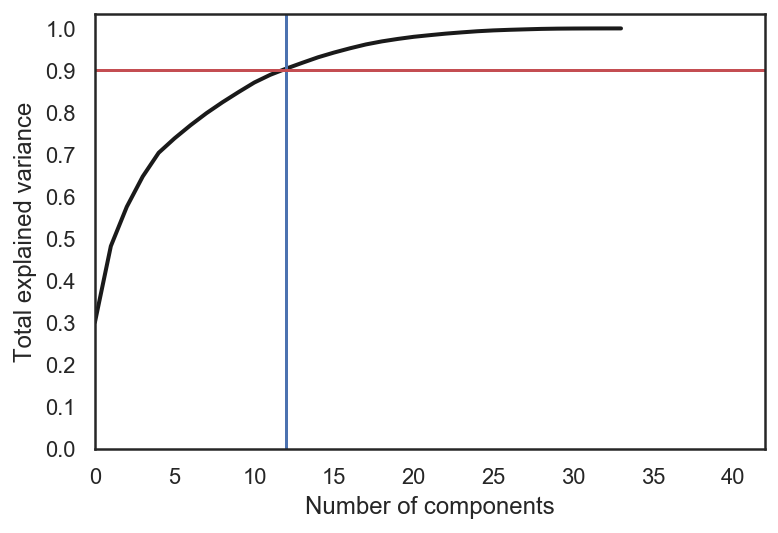

In [42]:
pca = decomposition.PCA().fit(X_centered)
plt.figure(figsize=(6,4))
plt.plot(np.cumsum(pca.explained_variance_ratio_), color='k', lw=2)
plt.xlabel('Number of components')
plt.ylabel('Total explained variance')
plt.xlim(0, 42)
plt.yticks(np.arange(0, 1.1, 0.1))
plt.axvline(12, c='b')
plt.axhline(0.9, c='r')
plt.show();

* 2 components can represent about 50% information of X
* 12 components can represent about 90% information of X

In [43]:
#features that compose each componet
for i, component in enumerate(pca.components_):
    print("{} component: {}% of initial variance".format(i + 1, 
          round(100 * pca.explained_variance_ratio_[i], 2)))
    print(pd.DataFrame(zip(component,X.columns)).sort_values(by=0,ascending=False))

1 component: 30.05% of initial variance
           0                                                  1
31  0.298611                         Renter_Occupied_Households
14  0.294582                                     youth_20_to_39
28  0.288786                                      num_of_2b_apt
12  0.286798                                   total_population
29  0.264771                                 num_of_3plus_b_apt
27  0.262529                                      num_of_1b_apt
9   0.257141                                      num_of_market
13  0.256223                                    num_of_children
17  0.206103                  American_Indian_Or_Alaskan_Native
26  0.201331                                  num_of_studio_apt
23  0.188854                           housing_built_after_1990
0   0.175750                                      num_of_airbnb
19  0.172528           household_income_less_than_25000_percent
15  0.164039                                              White


<h4> 4-2-2 Clustering

<h5> KMeans

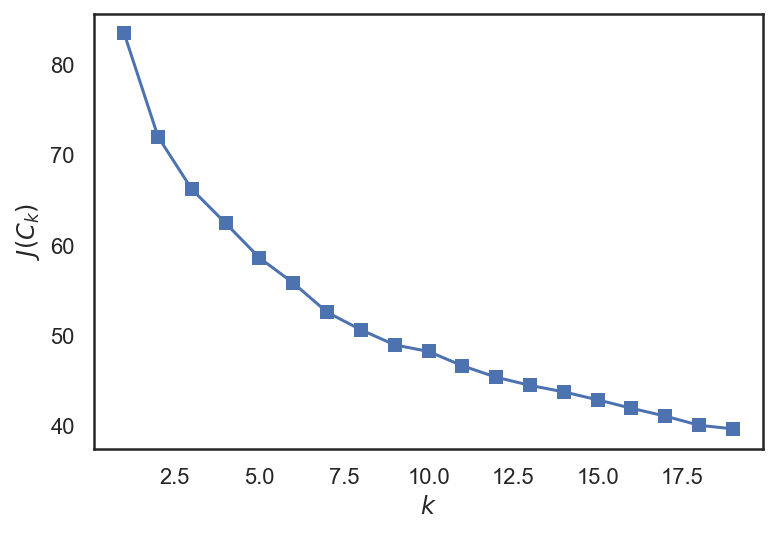

In [47]:
pca = decomposition.PCA(n_components=10)
X_reduced = pca.fit_transform(X_centered)
inertia = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(X_reduced)
    inertia.append(np.sqrt(kmeans.inertia_))

plt.plot(range(1, 20), inertia, marker='s');
plt.xlabel('$k$')
plt.ylabel('$J(C_k)$');

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 241 samples in 0.000s...
[t-SNE] Computed neighbors for 241 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 241 / 241
[t-SNE] Mean sigma: 2.361522
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.595707
[t-SNE] KL divergence after 300 iterations: 0.616058


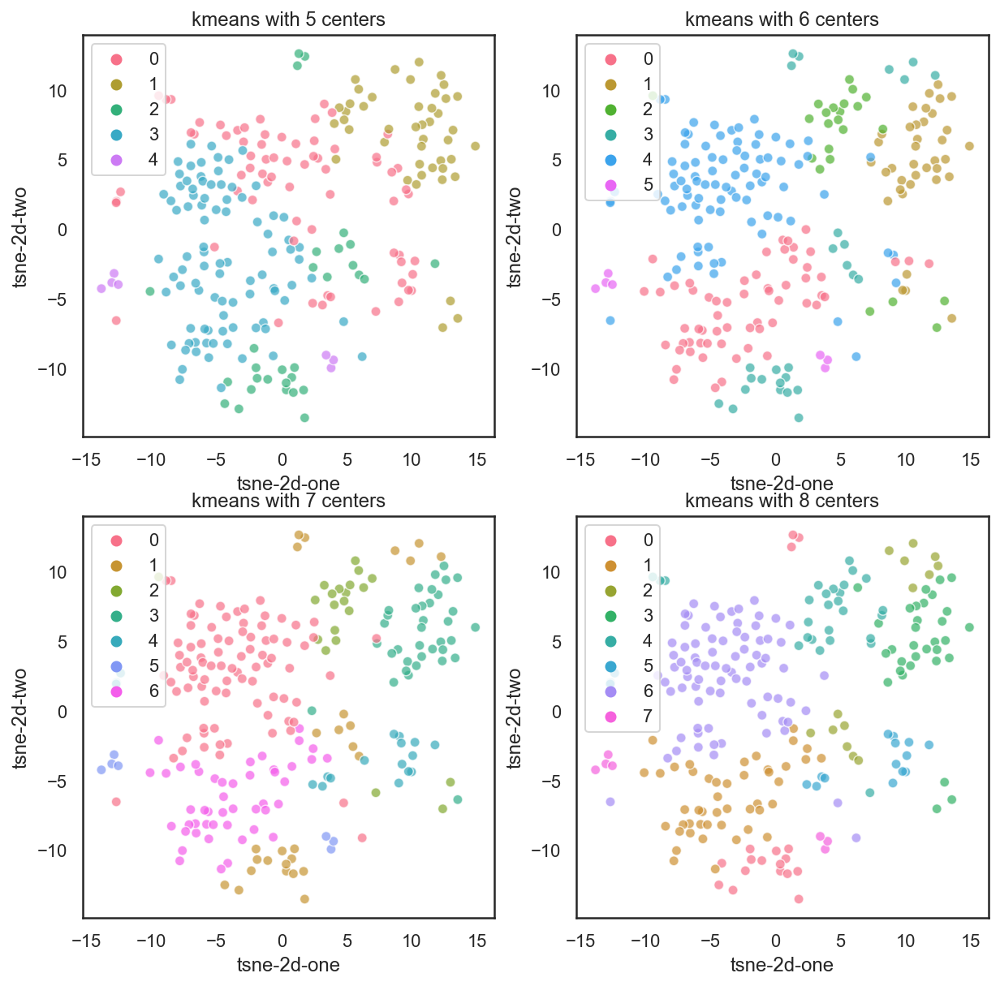

In [48]:
#visuliaze result with tsne
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X_norm)
df_subset = pd.DataFrame()
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]

fig, axes = plt.subplots(2, 2,figsize=(10,10))
for i in range(5,9):
    y_pred= KMeans(n_clusters=i, random_state=170,max_iter=2000).fit_predict(X_pca)
    
    ax = axes[int((i-5)/2), (i-5)%2]
 
    ax.set_title(f'kmeans with {i} centers')  
   
    sns.scatterplot(x="tsne-2d-one", y="tsne-2d-two", hue=y_pred,palette=sns.color_palette("husl",i),
                   data = df_subset,legend='full',alpha=0.7,ax=ax)

plt.show()

6 center works better 

<h5> KMedoids

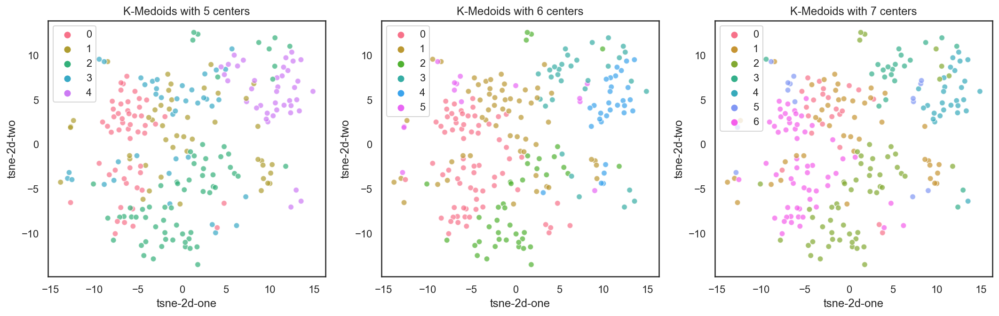

In [49]:
fig, axes = plt.subplots(1, 3,figsize=(18,5))
for i in range(5,8):
    y_pred= KMedoids(n_clusters=i, random_state=170,max_iter=2000).fit_predict(X_pca)
    ax = axes[i-5]   
    ax.set_title(f'K-Medoids with {i} centers')  
    sns.scatterplot(x="tsne-2d-one", y="tsne-2d-two", hue=y_pred,palette=sns.color_palette("husl",i),
                   data = df_subset,legend='full',alpha=0.7,ax=ax)

plt.show()

<h5> Hierarchy clustering

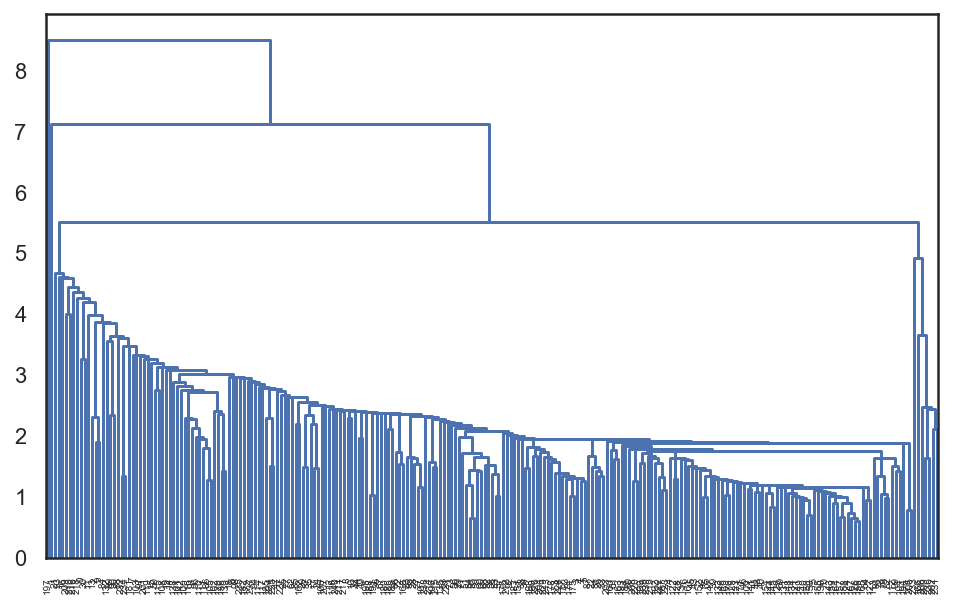

In [50]:

distance_mat = pdist(X_reduced) 
Z = hierarchy.linkage(distance_mat, 'single')
plt.figure(figsize=(8, 5))
dn = hierarchy.dendrogram(Z, color_threshold=0.2)

* hierarchy clustering result not good

<h5> Mean-Shift Clustering

number of estimated clusters : 6


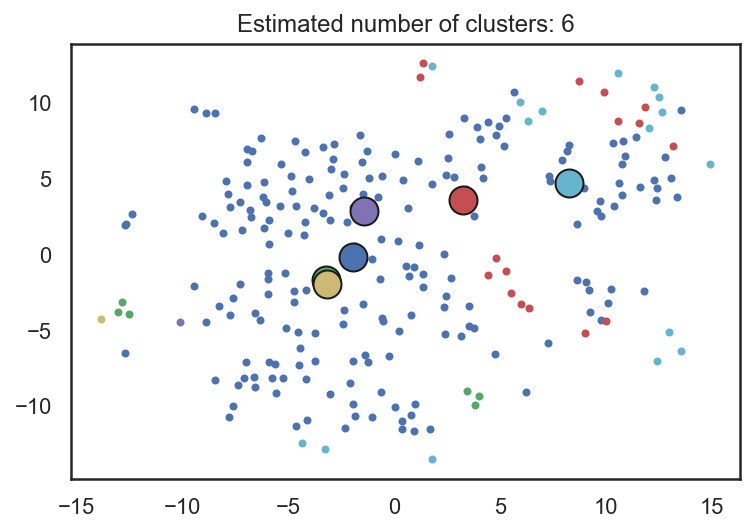

In [51]:
from sklearn.cluster import MeanShift, estimate_bandwidth
bandwidth = estimate_bandwidth(X_reduced, quantile=0.15)

ms = MeanShift(bandwidth=bandwidth,bin_seeding=True)
ms.fit(X_reduced)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

print("number of estimated clusters : %d" % n_clusters_)
from itertools import cycle

plt.figure(1)
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    my_members = labels == k
    cluster_center = cluster_centers[k]
    plt.plot(df_subset.loc[my_members, 'tsne-2d-one'], df_subset.loc[my_members, 'tsne-2d-two'], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

<h5> DBSCAN

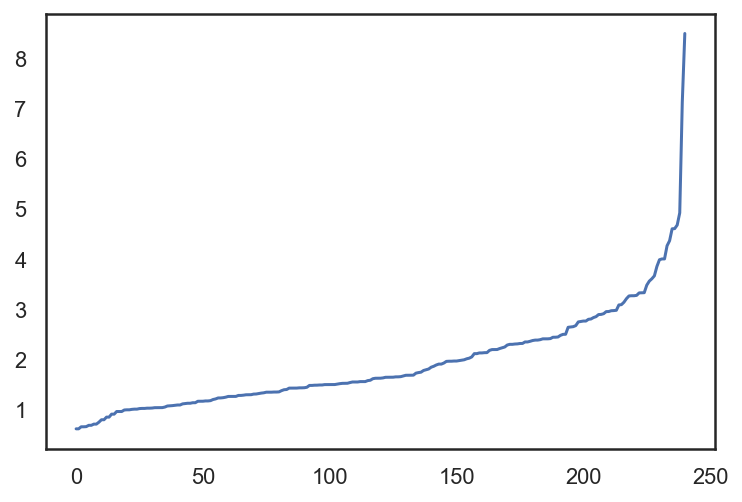

In [52]:
#find the optiaml eps
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_reduced)
distances, indices = nbrs.kneighbors(X_reduced)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

Estimated number of clusters: 3
Estimated number of noise points: 39
Silhouette Coefficient: 0.196


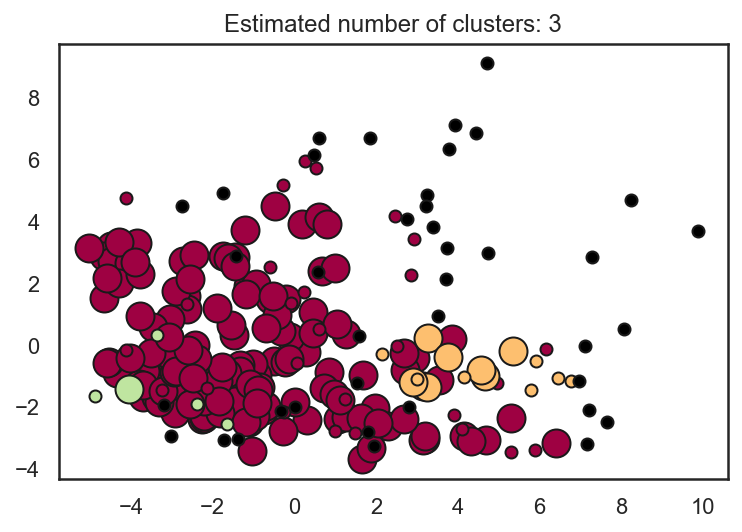

In [53]:
from sklearn.cluster import DBSCAN
from sklearn import metrics

db = DBSCAN(eps=3).fit(X_reduced)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X_norm, labels))

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]
    class_member_mask = (labels == k)   
    xy = X_reduced[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    xy = X_reduced[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

DBSCAN denote too much noise points

<h5>EM

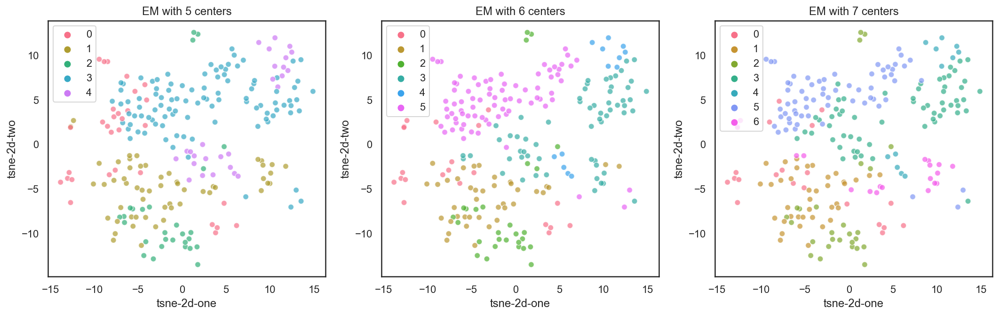

In [54]:
fig, axes = plt.subplots(1, 3,figsize=(18,5))
for i in range(5,8):
    y_pred= GaussianMixture(n_components=i, covariance_type='full', random_state=170,max_iter=2000).fit_predict(X_reduced)
    
    ax = axes[i-5]
    ax.set_title(f'EM with {i} centers')  
    sns.scatterplot(x="tsne-2d-one", y="tsne-2d-two", hue=y_pred,palette=sns.color_palette("husl",i),
                   data = df_subset,legend='full',alpha=0.7,ax=ax)

plt.show()

<li> Conclusion:  Use K-means with 6 centers to clustering 



<h4> 4-2-3 Visuliza Clustering Result(New York Example)


In [55]:
kmeans_pred = KMeans(n_clusters=6, random_state=170,max_iter=2000).fit_predict(X_reduced)
total['kmeans_pred'] = kmeans_pred
ny_pred = total.loc[total.zipcode.isin(ny_zipcodes)]

In [56]:
ny_pred.zipcode = ny_pred.zipcode.apply(str)

In [57]:
def get_color(label):
    if label==0:
        c = '#FF9933'
    elif label ==1:
        c = '#3780BF'
    elif label ==2:
        c ='#32AB60'
    elif label ==3:
        c = '#800080'
    elif label ==4:
        c= '#DB4052'
    elif label ==5:
        c='black'
    else:
        c='white'
    return c

<h4> Location

In [58]:
cluster = ny_pred.set_index('zipcode')['kmeans_pred']

def style_function(feature):
    label = cluster.get(feature['properties']['postalCode'])                   
    return {
        'fillOpacity': 0.5,'weight': 0,'fillColor': get_color(label)}

m = folium.Map(location=[40.7589,-73.9851],zoom_start=12)

folium.GeoJson('zipcode_geojson_data/ny_zipcode.geojson',
style_function=style_function).add_to(m)
m

<h4> Box Plot 

In [59]:
def draw_box(df,features,n):
    df=df.loc[df.kmeans_pred<5]
    fig = []

    for i in range(len(features)):
        table=df.pivot(values=f'{features[i]}',columns='kmeans_pred')
        fig.append(table.figure(kind='box',boxpoints='all',showlegend=False))
        
    iplot(cf.subplots(fig,shape=(n,2),subplot_titles=(features)))

<h5> Airbnb characters

In [60]:
draw_box(ny_pred,['num_of_airbnb','avg_price'],1)

<h5> Population characters

In [61]:
draw_box(ny_pred,['youth_20_to_39','White',
                  'Black_Or_African_American','household_income_less_than_25000_percent'],2)

In [62]:
draw_box(ny_pred,['employment_rate','bachelor_above_percentage'],1)

<h5> Convenience

In [63]:
ny_pred.columns

Index(['zipcode', 'num_of_airbnb', 'avg_price', 'total_reviews',
       'avg_location_review_score', 'avg_review_score', 'num_of_bus',
       'num_of_sub', 'c_distance', 'num_of_restaurant', 'num_of_market',
       'num_of_tourist_attractions', 'num_of_travel_agency',
       'total_population', 'num_of_children', 'youth_20_to_39', 'White',
       'Black_Or_African_American', 'American_Indian_Or_Alaskan_Native',
       'Asian', 'household_income_less_than_25000_percent',
       'bachelor_above_percentage', 'employment_rate', 'crimes_in_half_year',
       'housing_built_after_1990', 'home_value_less_than_400000',
       'home_value_more_than_400000', 'num_of_studio_apt', 'num_of_1b_apt',
       'num_of_2b_apt', 'num_of_3plus_b_apt',
       'vancancy_reason_For_Season_Recreational_Or_Occasional_Use',
       'Renter_Occupied_Households', 'Owned_Households_With_A_Mortgage',
       'zillow_rent_index', 'kmeans_pred'],
      dtype='object')

In [64]:
draw_box(ny_pred,['num_of_restaurant', 'num_of_market',
       'num_of_tourist_attractions','c_distance'],2)

<h5> Real Estate

In [65]:
draw_box(ny_pred,['zillow_rent_index', 'num_of_studio_apt',
       'housing_built_after_1990','Renter_Occupied_Households'],2)